In [ ]:
!pip install -q mediapy
!pip install pytube
!apt update && apt install -y handbrake
%pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.1 MB/s eta 0:00:00
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [814 kB]
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:8 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,753 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [2,333 kB]
Hit:10 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:11 https://ppa.launchpad

In [ ]:
%%capture
!pip install pixellib torchvision
# Instance segmentation model
!wget "https://github.com/ayoolaolafenwa/PixelLib/releases/download/0.2.0/pointrend_resnet50.pkl" -O pointrend_resnet50.pkl

In [ ]:
import ultralytics
from pytube import YouTube
import mediapy as media
import cv2
import numpy as np
import cv2 as cv
import time
import random
from matplotlib import pyplot as plt
import pixellib
from pixellib.torchbackend.instance import instanceSegmentation
from IPython.display import Image
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import torch

# Ejercicio 5

**Video base**

In [ ]:
url = 'video-persona-aparece.mp4'
video = media.read_video(url)
media.show_video(video)

**Funciones generales**

In [ ]:
def process_image(new_image, prev_image, **kwargs):
    new_image_float = new_image.astype(np.float32)
    new_image_float *= 0.5
    new_image_uint8 = np.clip(new_image_float, 0, 255).astype(np.uint8)

    return new_image_uint8

def draw_contours(frame, contours, color=(0, 255, 0), thickness=2):
    # Comprobar si la imagen es en escala de grises (1 canal)
    if len(frame.shape) == 2 or frame.shape[2] == 1:
        # Convertir la imagen de escala de grises a color (3 canales)
        result_image = cv2.cvtColor(frame, cv2.COLOR_GRAY2BGR)
    else:
        # Si ya es una imagen de color, simplemente hacer una copia
        result_image = frame.copy()

    # Dibujar cada contorno en la imagen
    for contour in contours:
        # Obtener el rectángulo delimitador para cada contorno
        x, y, w, h = cv2.boundingRect(contour)
        # Dibujar el rectángulo
        cv2.rectangle(result_image, (x, y), (x + w, y + h), color, thickness)

    return result_image

# Función para procesar un video:
def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    # Abrir el video de entrada para lectura
    with media.VideoReader(filename_in) as r:
        # Crear un archivo de video de salida
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0  # Inicializar contador de fotogramas
            prev_image = None  # Inicializar la imagen previa

            # Iterar sobre cada imagen (fotograma) del video
            for image in r:
                new_image = media.to_uint8(image)  # Convertir la imagen a formato flotante

                # Comprobar si es la primera imagen
                if prev_image is None:
                    prev_image = new_image.copy()

                # Procesar la imagen utilizando la función dada
                processed_image = process_func(new_image, prev_image, **kwargs)

                # Añadir la imagen procesada al video de salida
                w.add_image(processed_image)

                # Actualizar la imagen previa
                prev_image = new_image.copy()

                # Incrementar el contador de fotogramas
                count += 1

                # Detener el proceso si se alcanza el tiempo máximo
                if count >= max_time * r.fps:
                    break

**Frame Difference**

In [ ]:
def process_frame_difference(new_image, prev_image, **kwargs):
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_RGB2GRAY)
    prev_gray = cv2.cvtColor(prev_image, cv2.COLOR_RGB2GRAY)

    frame_diff = cv2.absdiff(new_gray, prev_gray)

    norm_diff = cv2.normalize(frame_diff, None, 0, 255, cv2.NORM_MINMAX)

    _, thresh = cv2.threshold(norm_diff, 120, 255, cv2.THRESH_BINARY)

    return cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB)


filename_out = 'frame_difference.mp4'
video_processor(url, filename_out, process_frame_difference, 10)
media.show_video(media.read_video(filename_out), fps=30)

**Optical flow - Sparse**

In [ ]:
def process_sparse_optical_flow(new_image, prev_image):
    new_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
    prev_gray_image = cv2.cvtColor(prev_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_sparse_optical_flow, "shi_tomasi_done"):
        feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)
        process_sparse_optical_flow.prev_points = cv2.goodFeaturesToTrack(new_gray, mask=None, **feature_params)
        process_sparse_optical_flow.mask = np.zeros_like(new_image)
        process_sparse_optical_flow.shi_tomasi_done = True

    if process_sparse_optical_flow.shi_tomasi_done:
        prev_points = process_sparse_optical_flow.prev_points
        mask = process_sparse_optical_flow.mask

    lk_params = dict(winSize=(15, 15), maxLevel=2,
                     criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    new_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray_image, new_gray, prev_points, None, **lk_params)
    good_old = prev_points[status == 1]
    good_new = new_points[status == 1]
    color = (0, 255, 0)

    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.astype(int).ravel()
        c, d = old.astype(int).ravel()
        mask = cv2.line(mask, (a, b), (c, d), color, 2)
        new_image = cv2.circle(new_image, (a, b), 3, color, -1)

    output = cv2.add(new_image, mask)
    process_sparse_optical_flow.prev_points = good_new.reshape(-1, 1, 2)
    return output


filename_out = 'sparse_optical_flow.mp4'
video_processor(url, filename_out, process_sparse_optical_flow, max_time=10)

media.show_video(media.read_video(filename_out), fps=30)

**Optical flow - Dense**

In [ ]:
def process_dense_optical_flow(new_image, prev_image):
    gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)

    if not hasattr(process_dense_optical_flow, "init_done"):
        process_dense_optical_flow.prev_gray = cv2.cvtColor(new_image, cv2.COLOR_BGR2GRAY)
        process_dense_optical_flow.mask = np.zeros_like(new_image)
        process_dense_optical_flow.mask[..., 1] = 255
        process_dense_optical_flow.init_done = True

    if process_dense_optical_flow.init_done:
        prev_gray = process_dense_optical_flow.prev_gray
        mask = process_dense_optical_flow.mask

    flow = cv2.calcOpticalFlowFarneback(prev_gray, gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    magnitude, angle = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    mask[..., 0] = angle * 180 / np.pi / 2
    mask[..., 2] = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(mask, cv2.COLOR_HSV2BGR)
    process_dense_optical_flow.prev_grayprev_gray = gray.copy()
    return rgb


filename_out = 'highway_process_dense_optical_flow.mp4'
video_processor(url, filename_out, process_dense_optical_flow, max_time=20)

media.show_video(media.read_video(filename_out), fps=30)

**Comentarios y discusion**



*   Utilizando el metodo de frame difference se observa gran cantidad de ruido, propio del metodo y el ruido introducido por el sensor de la camara. Al momento de pasar la persona este ruido se disminuye y se detecta la figura de la persona (para lograr una mejor deteccion es posible agregar dilatacion).
*   Optical flow Sparse: Al comienzo del video observamos los puntos seleccionados para hacer seguimiento (shi_tomasi_done). En el momento de aparecer la persona hace el seguimiento correcto a partir de esos puntos.
*   Optical Flow Dense: Se observa gran cantidad de ruido con la ausencia de la persona. Al aparecer esta puede observarse como el ruido desaparece y hace el seguimiento. Es importante destacar que identifica "distintos movimientos" dentro de la persona, ya que brazos y piernas siguen un movimiento distinto y no se mueve como un bloque (como podria hacerlo un auto en una autopista).







# Ejercicio 6


La localizacion de imagenes implica identificar de alguna forma (por ejemplo bounding box) la posicion de determinado objeto en la imagen; mientras que la clasificacion tiene como output el resultado de la clasificacion (por ejemplo que en la imagen hay un gato) pero no indica nada en la imagen.

Clasificacion:
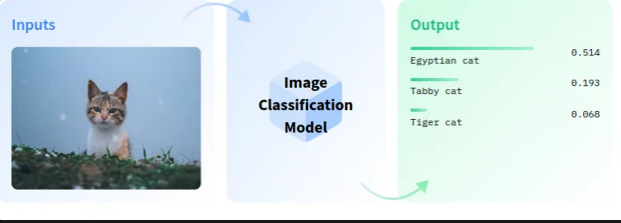

Localizacion:

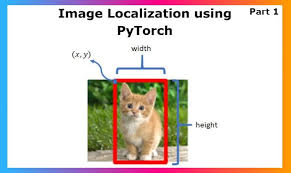

Clasificacion + Localizacion + Deteccion de objetos:


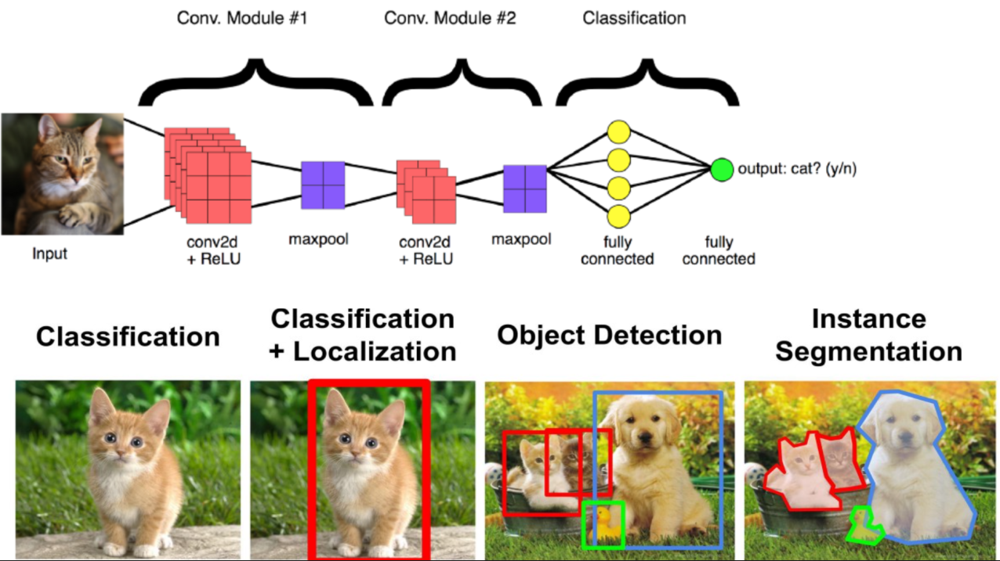

# Ejercicio 8

In [ ]:
yt = YouTube('https://www.youtube.com/watch?v=AHGMPZVWwUo')
video = yt.streams.filter(progressive=True, file_extension='mp4', res="720p").first()

video.download(filename='video_8_d.mp4')
print("Descarga completada.")
!ffmpeg -y -i video_8_d.mp4 -vf "scale=600:-1" -an -t 30 video_8.mp4

Descarga completada.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis -

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n')

def detect_objects(new_image, prev_image, **kwargs):
    results = model(new_image)

    classes = kwargs.get('classes', ['dog'])

    for box in results[0].boxes:
        x1, y1, x2, y2, confidence, cls = box.data[0]
        class_name = model.names[int(cls)]
        color = kwargs.get('color', (0, 255, 0))
        thickness = kwargs.get('thickness', 2)

        if class_name in classes:
            cv2.rectangle(new_image, (int(x1), int(y1)), (int(x2), int(y2)), color, thickness)
            confidence_text = f"{class_name}: {confidence:.2f}"
            cv2.putText(new_image, confidence_text, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return new_image


def video_processor(filename_in, filename_out, process_func, max_time=10, **kwargs):
    with media.VideoReader(filename_in) as r:
        with media.VideoWriter(filename_out, shape=r.shape, fps=r.fps, bps=r.bps) as w:
            count = 0
            prev_image = None

            for image in r:
                new_image = media.to_uint8(image)

                if prev_image is None:
                    prev_image = new_image.copy()

                processed_image = process_func(new_image, prev_image, **kwargs)
                w.add_image(processed_image)
                prev_image = new_image.copy()
                count += 1

                if count >= max_time * r.fps:
                    break


filename_in = 'video_8.mp4'
filename_out = 'video_8_yolo.mp4'
parameters = dict(classes=['dog'])

video_processor(filename_in, filename_out, detect_objects, 20, **parameters)

media.show_video(media.read_video(filename_out), fps=30)


0: 384x640 3 persons, 1 bicycle, 2 dogs, 213.2ms
Speed: 3.5ms preprocess, 213.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 1 dog, 149.4ms
Speed: 5.9ms preprocess, 149.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 bicycle, 1 dog, 133.0ms
Speed: 4.7ms preprocess, 133.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 1 bicycle, 1 dog, 131.8ms
Speed: 2.9ms preprocess, 131.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 1 bicycle, 1 dog, 142.2ms
Speed: 4.8ms preprocess, 142.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 2 bicycles, 1 dog, 138.2ms
Speed: 3.0ms preprocess, 138.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 1 dog, 144.8ms
Speed: 3.0ms preprocess, 144.8ms inference, 1.1ms postprocess per image at sha

Se observa que el modelo detecta con facilidad al perro cuando se encuentra solo, probablemente haya sido entrenado con fotos de esta raza de perro. Sin embargo cuando el hombre levanta al perro no puede detectarlo, parece que al segmentar esta tomando a ambos como un solo objeto.

In [ ]:
%%capture
!wget -O 'MobileNetSSD_deploy.prototxt' https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.prototxt.txt
!wget -O 'MobileNetSSD_deploy.caffemodel' https://github.com/TheNsBhasin/DNN_Object_Detection/blob/master/MobileNetSSD_deploy.caffemodel?raw=true

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

modelo = 'MobileNetSSD_deploy.caffemodel'
configuracion = 'MobileNetSSD_deploy.prototxt'
clases = ["background", "aeroplane", "bicycle", "bird", "boat",
          "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
          "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
          "sofa", "train", "tvmonitor"]
net = cv2.dnn.readNetFromCaffe(configuracion, modelo)


def obj_detc(imagen, prev_image, **kwargs):
  (h, w) = imagen.shape[:2]
  blob = cv2.dnn.blobFromImage(cv2.resize(imagen, (300, 300)), 0.007843, (300, 300), 127.5)

  net.setInput(blob)
  detecciones = net.forward()

  for i in np.arange(0, detecciones.shape[2]):
      confianza = detecciones[0, 0, i, 2]
      idx = int(detecciones[0, 0, i, 1])

      if confianza > 0.2 and idx == clases.index("dog"):
          box = detecciones[0, 0, i, 3:7] * np.array([w, h, w, h])
          (startX, startY, endX, endY) = box.astype("int")

          etiqueta = "{}: {:.2f}%".format(clases[idx], confianza * 100)
          cv2.rectangle(imagen, (startX, startY), (endX, endY), (0, 255, 0), 2)
          y = startY - 15 if startY - 15 > 15 else startY + 15
          cv2.putText(imagen, etiqueta, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

      return imagen

In [ ]:
video_processor(filename_in, "video_8_mobilenet.mp4", obj_detc, 20, **parameters)

In [ ]:
media.show_video(media.read_video("video_8_mobilenet.mp4"), fps=30)
## En este caso, mobilenet, se observa mas dificultad para detectar al perro. Puede deberse a que no este bien entrenada para estas situaciones, o que no este entrenada con imagenes de este tipo de perro.

In [ ]:
%%capture
!pip install transformers timm
!wget "https://github.com/openmaptiles/fonts/raw/master/roboto/Roboto-Regular.ttf" -O "Roboto-Regular.ttf"

In [ ]:
from transformers import pipeline
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

font = ImageFont.truetype("Roboto-Regular.ttf", 40)
object_detector = pipeline("object-detection", model="facebook/detr-resnet-50")

def draw_bounding_box(im, score, label, xmin, ymin, xmax, ymax, index, num_boxes):
    im_with_rectangle = ImageDraw.Draw(im)
    im_with_rectangle.rounded_rectangle([xmin, ymin, xmax, ymax], outline="red", width=5, radius=10)

    im_with_rectangle.text((xmin + 10, ymin - 40), f"{label} ({score:.2f})", fill="white", font=font)

    return im


def detr(image, prev, **kwargs):
  im = Image.fromarray(image)
  bounding_boxes = object_detector(im)
  num_boxes = len(bounding_boxes)

  for index, bounding_box in enumerate(bounding_boxes):
      box = bounding_box['box']
      im = draw_bounding_box(im, bounding_box['score'], bounding_box['label'],
                              int(box['xmin']), int(box['ymin']), int(box['xmax']),
                              int(box['ymax']), index, num_boxes)

  return im

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
video_processor(filename_in, "video_8_detr.mp4", detr, 20, **parameters)
media.show_video(media.read_video("video_8_detr.mp4"), fps=30)

AttributeError: dtype

# Ejercicio 9

R-CNN

In [ ]:
%%capture
!wget http://download.tensorflow.org/models/object_detection/mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar zxvf mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mscoco_labels.names -O mscoco_labels.names
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/colors.txt -O colors.txt
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt -O mask_rcnn_inception_v2_coco_2018_01_28.pbtxt
!wget https://raw.githubusercontent.com/matterport/Mask_RCNN/master/images/7933423348_c30bd9bd4e_z.jpg -O police_motorbike.jpg

In [ ]:
confThreshold = 0.3
maskThreshold = 0.3

# Cargar los nombres de las clases de MSCOCO
classesFile = "mscoco_labels.names"
classes = None
with open(classesFile, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Cargar los colores para visualizar las detecciones
colorsFile = "colors.txt"
colors = []
with open(colorsFile, 'rt') as f:
    colorsStr = f.read().rstrip('\n').split('\n')
    for i in range(len(colorsStr)):
        rgb = colorsStr[i].split(' ')
        color = np.array([float(rgb[0]), float(rgb[1]), float(rgb[2])])
        colors.append(color)

# Archivos de configuración y pesos del modelo Mask R-CNN
textGraph = "./mask_rcnn_inception_v2_coco_2018_01_28.pbtxt"
modelWeights = "./mask_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb"

In [ ]:
# Cargar la red
net = cv.dnn.readNetFromTensorflow(modelWeights, textGraph)
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

image = cv.imread('segment.jpg')
(H, W) = image.shape[:2]

blob = cv.dnn.blobFromImage(image, swapRB=True, crop=False)
net.setInput(blob)
start = time.time()
(boxes, masks) = net.forward(["detection_out_final", "detection_masks"])
end = time.time()

# Información de tiempo y formas de las detecciones y máscaras
print("[INFO] Mask R-CNN tomó {:.6f} segundos en procesar la imagen".format(end - start))
print("[INFO] Forma de boxes: {}".format(boxes.shape))
print("[INFO] Forma de masks: {}".format(masks.shape))

[INFO] Mask R-CNN tomó 8.874798 segundos en procesar la imagen
[INFO] Forma de boxes: (1, 1, 100, 7)
[INFO] Forma de masks: (100, 90, 15, 15)


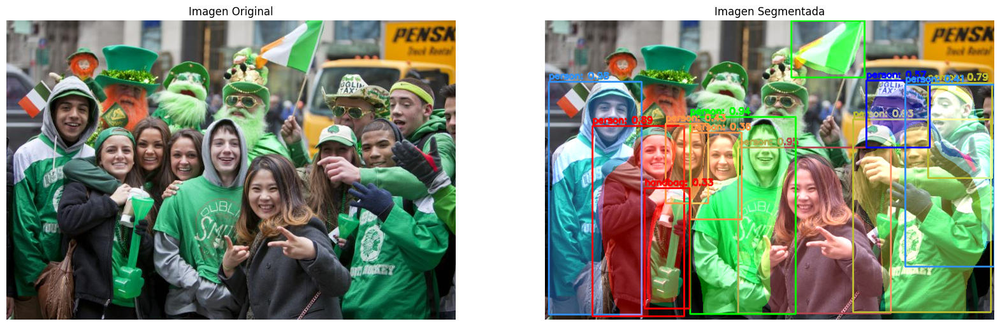

In [ ]:
output_image = image.copy()

for i in range(0, boxes.shape[2]):
    confidence = boxes[0, 0, i, 2]
    if confidence > confThreshold:
        classId = int(boxes[0, 0, i, 1])
        box = boxes[0, 0, i, 3:7] * np.array([W, H, W, H])
        (startX, startY, endX, endY) = box.astype("int")

        mask = masks[i, classId]
        mask = cv.resize(mask, (endX - startX, endY - startY))
        mask = (mask > maskThreshold).astype("uint8")

        roi = output_image[startY:endY, startX:endX]

        color = random.choice(colors)
        color_mask = np.zeros_like(roi)
        color_mask[mask == 1] = color

        roi = cv.addWeighted(roi, 1, color_mask, 0.4, 0)

        output_image[startY:endY, startX:endX] = roi

        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)

        classId = int(boxes[0, 0, i, 1])
        className = classes[classId]

        label = f"{className}: {confidence:.2f}"
        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)
        cv.putText(output_image, label, (startX, startY - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


# Configurar los subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Mostrar la imagen original
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0].set_title('Imagen Original')
axes[0].axis('off')  # Ocultar los ejes

# Mostrar la imagen segmentada
axes[1].imshow(cv.cvtColor(output_image, cv.COLOR_BGR2RGB))
axes[1].set_title('Imagen Segmentada R-CNN')
axes[1].axis('off')  # Ocultar los ejes

# Mostrar ambas imágenes
plt.show()

PointRend

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


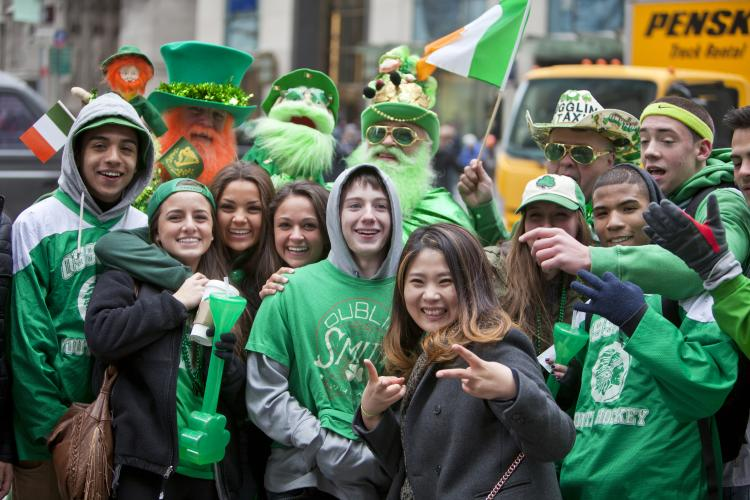

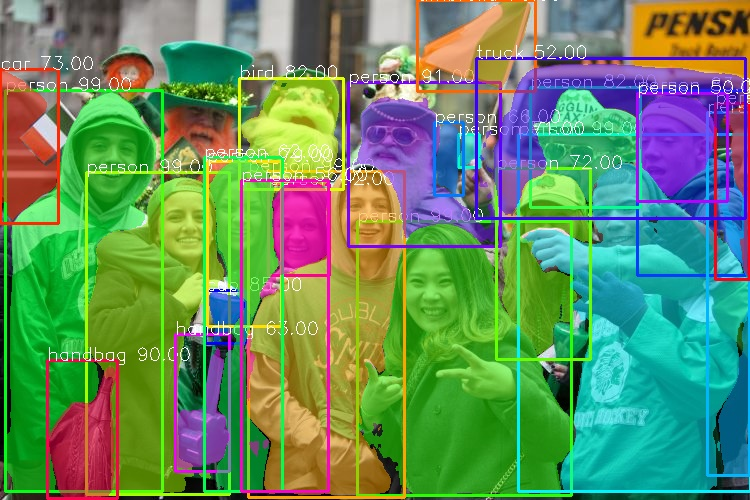

In [ ]:
ins = instanceSegmentation()
ins.load_model("pointrend_resnet50.pkl")
ins.segmentImage("segment.jpg", show_bboxes=True, output_image_name="segment_segmented.jpg")

display(Image(filename="segment.jpg"))
display(Image(filename="segment_segmented.jpg"))

DeepLab v3

In [ ]:
%%capture
!pip install torchvision

model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

In [ ]:
input_image = Image.open("segment.jpg").convert("RGB").convert("RGB")

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)


if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)['out'][0]
output_predictions = output.argmax(0)


palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
colors = (colors % 255).numpy().astype("uint8")


r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
r.putpalette(colors)

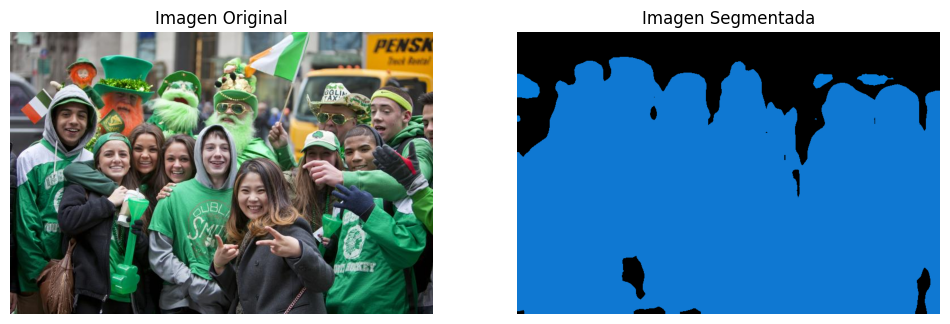

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(r)
plt.title('Imagen Segmentada')
plt.axis('off')

plt.show()

DETR ResNet50

In [ ]:
!pip install timm

In [ ]:
import io
import requests
from PIL import Image, ImageDraw, ImageFont
import itertools
import seaborn as sns
from transformers import DetrFeatureExtractor, DetrForSegmentation
from transformers.models.detr.feature_extraction_detr import rgb_to_id


image = cv2.imread("segment.jpg")

# Cargar el modelo y el extractor de características
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

# Preparar la imagen para el modelo
inputs = feature_extractor(images=image, return_tensors="pt")

# Paso forward
outputs = model(**inputs)

# Postprocesamiento
processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.85)[0]

# Convertir la segmentación a numpy
panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg_id = rgb_to_id(panoptic_seg)

# Preparar la paleta de colores
palette = itertools.cycle(sns.color_palette())

# Crear la imagen segmentada
segmented_image = Image.fromarray(np.zeros_like(panoptic_seg, dtype=np.uint8))
draw = ImageDraw.Draw(segmented_image)

# Añadimos un mapeo manual de los IDs de las categorías a los nombres, basado en las clases comunes de COCO
COCO_LABELS = {
    1: 'persona', 2: 'bicicleta', 3: 'coche', 4: 'motocicleta', 5: 'avión',
    6: 'autobús', 7: 'tren', 8: 'camión', 9: 'barco', 10: 'semáforo',
    11: 'hidrante', 13: 'señal de stop', 14: 'parquímetro', 15: 'banco', 16: 'pájaro',
    17: 'gato', 18: 'perro', 19: 'caballo', 20: 'oveja', 21: 'vaca',
    22: 'elefante', 23: 'oso', 24: 'cebra', 25: 'jirafa', 27: 'mochila',
    28: 'paraguas', 31: 'bolso de mano', 32: 'corbata', 33: 'maleta', 34: 'frisbee',
    36: 'tabla de snowboard', 37: 'pelota deportiva', 38: 'cometa', 39: 'bate de béisbol',
    40: 'guante de béisbol', 41: 'patineta', 42: 'tabla de surf', 43: 'raqueta de tenis',
    44: 'botella', 46: 'plato de vino', 47: 'taza', 48: 'tenedor', 49: 'cuchillo',
    50: 'cuchara', 51: 'tazón', 52: 'banana', 53: 'manzana', 54: 'sándwich',
    55: 'naranja', 56: 'brócoli', 57: 'zanahoria', 58: 'perrito caliente', 59: 'pizza',
    60: 'donut', 61: 'pastel', 62: 'silla', 63: 'sofá', 64: 'maceta', 65: 'cama',
    67: 'mesa de comedor', 70: 'inodoro', 72: 'TV', 73: 'computadora portátil', 74: 'ratón',
    75: 'control remoto', 76: 'teclado', 77: 'teléfono celular', 78: 'microondas',
    79: 'horno', 80: 'tostadora', 81: 'fregadero', 82: 'refrigerador', 84: 'libro',
    85: 'reloj', 86: 'florero', 87: 'tijeras', 88: 'oso de peluche', 89: 'secador de pelo',
    90: 'cepillo de dientes',
}

# Ajusta el bucle para dibujar segmentos y etiquetas correctamente
for segment_info in result["segments_info"]:
    class_id = segment_info["category_id"]
    class_name = COCO_LABELS.get(class_id, 'Desconocido')  # 'Desconocido' si el ID no está en el diccionario
    id = segment_info["id"]

    # Generar la máscara para este segmento específico
    mask = panoptic_seg_id == id
    color = np.array(next(palette)) * 255  # Convertir el color a un array de numpy adecuado

    # Convertir la máscara a una imagen de PIL para usarla como máscara en 'paste'
    mask_image = Image.fromarray((mask * 255).astype(np.uint8))

    # Crear una imagen del color del segmento que tenga las dimensiones correctas
    color_image = Image.new("RGB", segmented_image.size, color=tuple(color.astype(int)))

    # Pegar usando la máscara para aplicar solo este segmento
    segmented_image.paste(color_image, (0,0), mask=mask_image)

    # Dibujar el nombre de la clase en la posición inicial del segmento
    draw = ImageDraw.Draw(segmented_image)
    where = np.where(mask)
    if where[0].size > 0 and where[1].size > 0:
        x, y = np.min(where[1]), np.min(where[0])
        draw.text((x, y), class_name, fill='white')

# Mostrar la imagen original y la segmentada
plt.figure(figsize=(30, 15))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)
plt.title('Imagen Segmentada con Etiquetas')
plt.axis('off')

plt.show()


ImportError: 
DetrConvEncoder requires the timm library but it was not found in your environment. You can install it with pip:
`pip install timm`. Please note that you may need to restart your runtime after installation.


SAM

In [ ]:
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
!{sys.executable} -m pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision

!mkdir images
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.2.1+cu121
Torchvision version: 0.17.1+cu121
CUDA is available: False
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-uy03kqtl
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-uy03kqtl
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36620 sha256=0cdd77d860a11be6ffa8419e9af1a64b7e7d0f715431e0856c132d2bf3a8ebf8
  Stored in directory: /tmp/pip-ephem-wheel-cache-vgess_l9/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.1/74.1 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━

In [ ]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [ ]:
image = cv2.imread('segment.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [ ]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

masks = mask_generator.generate(image)

print(len(masks))
print(masks[0].keys())

plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx